# Set up

In [2]:
import s3fs
import h5py
import numpy as np
import matplotlib.pyplot as plt
import re
s3 = s3fs.S3FileSystem()

In [3]:
# Dictionaries for line style, color and index of variables
line_style_dict = {'U10': '-', 'V10': '--', 'T2m': '-.', 'sp': ':', 'mslp': '-', 'U1000': '--', 'V1000': '-.', 'Z1000': ':', 'T850': '-', 'U850': '--', 'V850': '-.', 'Z850': ':', 'RH850': '-', 'T500': '--', 'U500': '-.', 'V500': ':', 'Z500': '-', 'RH500': '--', 'Z50': '-.', 'TCWV': ':'}
# line_color_dict = {'U10': 'b', 'V10': 'g', 'T2m': 'r', 'sp': 'c', 'mslp': 'y', 'U1000': 'b', 'V1000': 'g', 'Z1000': 'r', 'T850': 'c', 'U850': 'y', 'V850': 'b', 'Z850': 'g', 'RH850': 'r', 'T500': 'c', 'U500': 'y', 'V500': 'b', 'Z500': 'g', 'RH500': 'r', 'Z50': 'c', 'TCWV': 'y'}
line_color_dict = {'None': 'black', 'U10': 'b', 'V10': 'b', 'T2m': 'b', 'sp': 'b', 'mslp': 'g', 'U1000': 'g', 'V1000': 'g', 'Z1000': 'g', 'T850': 'r', 'U850': 'r', 'V850': 'r', 'Z850': 'r', 'RH850': 'c', 'T500': 'c', 'U500': 'c', 'V500': 'c', 'Z500': 'y', 'RH500': 'y', 'Z50': 'y', 'TCWV': 'y'}
index_dict = {'None': -1, 'U10': 0, 'V10': 1, 'T2m': 2, 'sp': 3, 'mslp': 4, 'U1000': 5, 'V1000': 6, 'Z1000': 7, 'T850': 8, 'U850': 9, 'V850': 10, 'Z850': 11, 'RH850': 12, 'T500': 13, 'U500': 14, 'V500': 15, 'Z500': 16, 'RH500': 17, 'Z50': 18, 'TCWV': 19}
idx2name = {-1: "None", 0: "U10", 1: "V10", 2: "T2m", 3: "sp", 4: "mslp", 5: "U1000", 6: "V1000", 7: "Z1000", 8: "T850", 9: "U850", 10: "V850", 11: "Z850", 12: "RH850", 13: "T500", 14: "U500", 15: "V500", 16: "Z500", 17: "RH500", 18: "Z50", 19: "TCWV"}

# Lists for prediction and ablation variables
predict_variables = ['U10', 'V10', 'T2m', 'sp', 'mslp', 'Z1000', 'Z850', 'RH850']
ablate_variables = ['U10', 'V10', 'T2m', 'sp', 'mslp', 'U1000', 'V1000', 'Z1000', 'T850', 'U850', 'V850', 'Z850', 'RH850', 'T500', 'U500', 'V500', 'Z500', 'RH500', 'Z50', 'TCWV']
predict_variables = ablate_variables.copy()

# Key

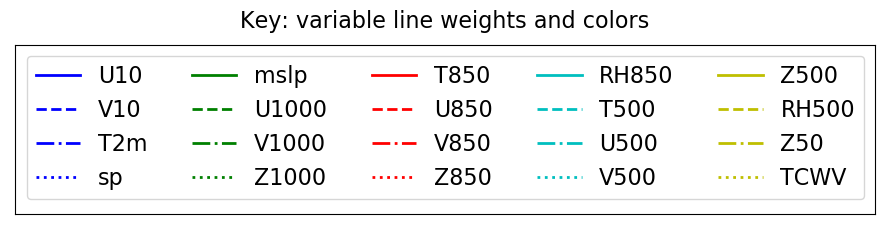

In [4]:
plt.figure(figsize=(11.1, 2.2))
x = [0]

for i, (label, line_style) in enumerate(line_style_dict.items()):
    y = [i]
    line_color = line_color_dict[label]
    plt.plot(x, y, linestyle=line_style, color=line_color, label=label, linewidth=2)

plt.title('Key: variable line weights and colors', fontsize=16, y=1.05)
plt.legend(loc='upper right', bbox_to_anchor=(1, 1), ncol=5, prop={'size': 16})  # Adjust the bbox_to_anchor and ncol parameters
plt.xticks([])
plt.yticks([])
plt.show()

# Helper Functions

In [5]:
# Extract ACC and RMSE from files based on the target, ablation, steps, and main directory
def get_data(predict, ablate, steps, file_path):
    f = h5py.File(file_path, 'r')
    
    rmse = f['rmse'][0,:, index_dict[predict]]
    acc = f['acc'][0,:, index_dict[predict]]
    
    
    return rmse, acc

In [48]:
# Find a path for each ablated variable
paths = ['../override_dir/ablation_experiments/V10/predict-V10_ablate-U10_30-timesteps_vis.h5']
for var in ablate_variables:
    if var != 'U10':
        paths.append(f'../override_dir/ablation_experiments/U10/predict-U10_ablate-{var}_30-timesteps_vis.h5')

steps = 30

rmse_list = []
acc_list = []

for i, path in enumerate(paths):
    f = h5py.File(path, 'r')
    rmse = f['rmse'][0,:,:] # take last value for heatmap, of all variables
    print(rmse.shape)
    rmse = np.mean(rmse, axis=0)
    print(rmse.shape)
    rmse = rmse[::-1]
    rmse_list.append(rmse)
    
    acc = f['acc'][0,:,:] # take last value for heatmap
    acc = np.mean(acc, axis=0)
    acc[acc < 0] = 0
    # if i == 4:
    #     acc[2:10] = 3
    acc = acc[::-1] # reverse so the order is correct
    acc_list.append(acc)

''' 
Params: 
metric_list: list of acc/rmse results where the 0-th element is the 20 values (one for each predicted variable)
             corresponding to the 0-th ablation (ablation of U10).
        
'''
def heatmap_full(metric_list, metric_label):
    print(np.array(metric_list).shape)
    # Construct heatmap starting with each element as inf
    data = np.ones((len(ablate_variables), len(ablate_variables)))*np.inf
    data = np.vstack(metric_list).T
    
    # data[0,0] = 2
    # data[-1, -1] = 2
    
    if metric_label == 'rmse':
        data = np.log(data)
        plt.figure(figsize=(10, 10))
        heatmap = plt.imshow(data, cmap='inferno_r', interpolation='nearest') #, vmin=np.max(data), vmax=np.min(data))

    if metric_label == 'acc':
        # data = 1 - data
        plt.figure(figsize=(10, 10))
        heatmap = plt.imshow(data, cmap='inferno', interpolation='nearest')

    # Set categorical labels for x-axis and y-axis
    plt.xticks(np.arange(len(ablate_variables)), ablate_variables, rotation=90)
    plt.yticks(np.arange(len(ablate_variables)), reversed(ablate_variables))

    plt.colorbar(heatmap, shrink=0.8)
    plt.xlabel('Ablated Variable')
    plt.ylabel('Predict Variable')
    label = metric_label.upper() if metric_label == 'acc' else f'log({metric_label.upper()})'
    plt.title(f'Heatmap of variable ablation impacts on {label} (mean of all timesteps)', fontsize=16, y=1.05)

    plt.show()

(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)
(30, 20)
(20,)


In [ ]:
heatmap_full(acc_list, 'acc')

(20, 20)
(20, 20)


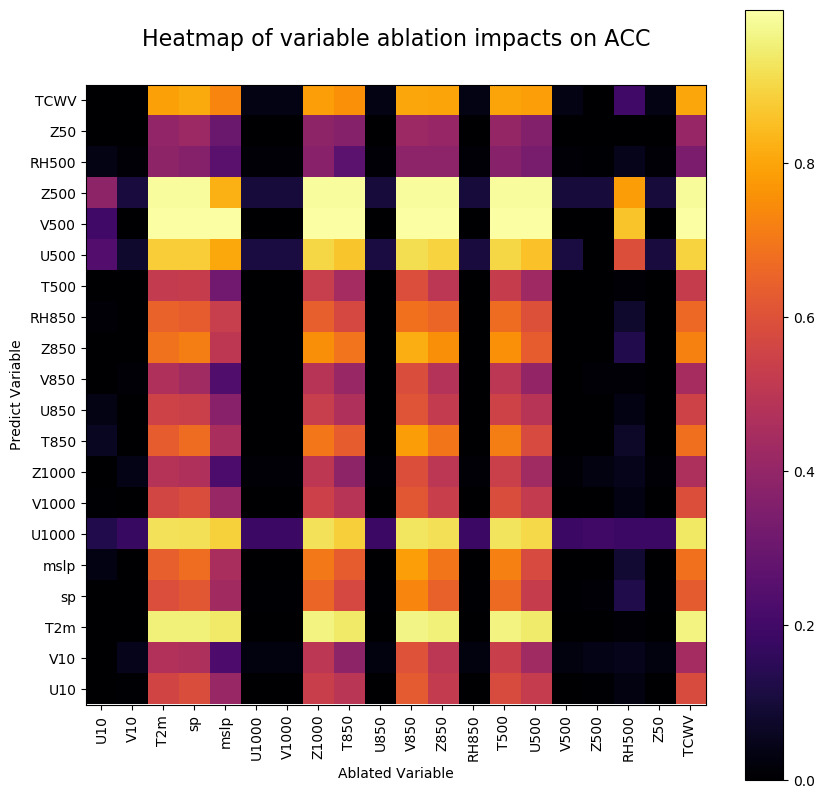

In [122]:
heatmap_full(acc_list, 'acc')

In [ ]:
import numpy as np

# Create a list of arrays
array_list = [np.array([1, 2, 3]),
              np.array([4, 5, 6]),
              np.array([7, 8, 9])]

print(array_list)
plt.figure(figsize=(10, 10))
heatmap = plt.imshow(array_list, cmap='inferno', interpolation='nearest')
plt.colorbar(heatmap)
plt.show()

# Vertical stacking (stack arrays vertically to create a matrix)
array_list = np.vstack(array_list)
print(array_list)
plt.figure(figsize=(10, 10))
heatmap = plt.imshow(array_list, cmap='inferno', interpolation='nearest')
plt.colorbar(heatmap)
plt.show()


# Horizontal stacking (stack arrays horizontally to create a matrix)
horizontal_stacked_matrix = np.hstack(array_list)

print("Vertical stacked matrix:")
print(vertical_stacked_matrix)

print("Horizontal stacked matrix:")
print(horizontal_stacked_matrix)

print(array_list)
print(i for i in reversed(array_list))


In [10]:
def analyze_ablations(predict, ablate_variables, steps, directory, verbose, plot, save_path=None):
    rmse_arrays = {}
    acc_arrays = {}
    time = None
    
    high_impact = []
    low_impact = []
    other_impact = []
    
    # Remove the predict variable from the list of variables to ablate
    ablate_variables = [var for var in ablate_variables if var is not predict]
    
    # Extract the rmse and acc for each ablated variable
    for ablate in ablate_variables:
        file_path = directory + f"{predict}/predict-{predict}_ablate-{ablate}_{steps}-timesteps_vis.h5"
        rmse, acc = get_data(predict, ablate, steps, file_path)
        rmse_arrays[ablate] = rmse
        acc_arrays[ablate] = acc
        if verbose:
            print(f'rmse of {rmse[-1]} for variable {ablate}')
            print(f'acc of {acc[-1]} for variable {ablate}')
        
        if rmse[-1] > 10 and acc[-1] < 0.2:
            high_impact.append(ablate)
        elif rmse[-1] < 10 and acc[-1] > 0.2:
            low_impact.append(ablate)
        else:
            other_impact.append(ablate)
        
        
    if verbose:
        print(f'Found {len(high_impact)} High impact variables for {predict}: {high_impact}')
        print(f'Found {len(low_impact)} Low impact variables for {predict}: {low_impact}')
        print(f'Found {len(other_impact)} other variables for {predict}: {other_impact}')
        
    # Create plot
    def create_plot(arrays_dict, array_label, predict, save_path=None):
        plt.figure(figsize=(10, 6))
        for var, array in arrays_dict.items():
            time = np.arange(len(array))
            index, style, color = index_dict[var], line_style_dict[var], line_color_dict[var]
            plt.plot(time, array, linestyle=style, color=color, label=var)

        plt.xlabel('Time')
        plt.ylabel(f'{array_label} of {predict} prediction')
        plt.title(f'{array_label} of {predict} prediction for Multiple Channel Ablations', fontsize=20, y=1.05)
        plt.legend()
        plt.grid(True)
        plt.legend(bbox_to_anchor=(1, 0.5), loc='center left')  # Position legend on the right
        plt.tight_layout()  # Adjust plot layout
        
        if save_path:
            path = save_path + f'/{predict}_{array_label}.png'
            plt.savefig(path, format='png')
        
        plt.show() # Display the plot


    if plot:
        # Create the RMSE and ACC plots
        create_plot(arrays_dict=rmse_arrays, array_label='RMSE', predict=predict, save_path=save_path)
        create_plot(arrays_dict=acc_arrays, array_label='ACC', predict=predict, save_path=save_path)
    
    return rmse_arrays, acc_arrays, high_impact, low_impact, other_impact


In [11]:
def heatmap(arrays, array_label):
    data = np.ones((len(predict_variables), len(ablate_variables)))*np.inf
    
    for i, predict in enumerate(predict_variables):
        array = arrays[predict]
        
        for ablated, values in array.items():
            data[i, index_dict[ablated]] = values[-1]
    
    if array_label == 'RMSE':
        data = np.log(data)
        plt.figure(figsize=(10, 5))
        heatmap = plt.imshow(data, cmap='inferno', interpolation='nearest') #, vmin=np.max(data), vmax=np.min(data))

    if array_label == 'ACC':
        data = 1 - data
        plt.figure(figsize=(10, 5))
        heatmap = plt.imshow(data, cmap='inferno', interpolation='nearest')

    # Set categorical labels for x-axis and y-axis
    plt.xticks(np.arange(len(ablate_variables)), ablate_variables, rotation=90)
    plt.yticks(np.arange(len(predict_variables)), predict_variables)

    plt.colorbar(heatmap)
    plt.xlabel('Ablated Variable')
    plt.ylabel('Predict Variable')
    plt.title(f'Heatmap of variable ablation impacts on {array_label}', fontsize=16, y=1.05)

    plt.show()

# Baseline prediction (no ablations)

In [12]:
# Create plot
def create_plot(arrays_dict, array_label, predict, save_path=None):
    plt.figure(figsize=(10, 6))
    for var, array in arrays_dict.items():
        time = np.arange(len(array))
        index, style, color = index_dict[var], line_style_dict[var], line_color_dict[var]
        plt.plot(time, array, linestyle=style, color=color, label=var)

    plt.xlabel('Time')
    plt.ylabel(f'{array_label} of {predict} prediction')
    plt.title(f'{array_label} of {predict} prediction for Multiple Channel Ablations', fontsize=20, y=1.05)
    plt.legend()
    plt.grid(True)
    plt.legend(bbox_to_anchor=(1, 0.5), loc='center left')  # Position legend on the right
    plt.tight_layout()  # Adjust plot layout

    if save_path:
        path = save_path + f'/{predict}_{array_label}.png'
        plt.savefig(path, format='png')

    plt.show() # Display the plot

In [13]:
def plot_rmse_acc(file_path, abl):
    f = h5py.File(file_path, 'r')
    
    time = np.arange(f['rmse'].shape[1])

    # Plot RMSE
    plt.plot(time, f['rmse'][0,:,0], marker='o', label='RMSE')
    # plt.plot(time, f['rmse_coarse'][0,:,0], marker='o', label='RMSE Coarse')

    plt.xlabel('Time (6-hour timesteps)')
    plt.ylabel('RMSE')
    plt.title(f'RMSE over Time — Ablated: {idx2name[abl]}')
    plt.legend()
    plt.grid(True)

    plt.show()

    time = np.arange(f['acc'].shape[1])

    # Plot accuracy
    plt.plot(time, f['acc'][0,:,2], marker='o', label='ACC')
    plt.plot(time, f['acc_unweighted'][0,:,0], marker='o', label='ACC Unweighted')
    # plt.plot(time, f['acc_coarse'][0,:,0], marker='o', label='Accuracy Coarse')
    # plt.plot(time, f['acc_coarse_unweighted'][0,:,0], marker='o', label='Accuracy Coarse Unweighted')

    plt.xlabel('Time (6-hour timesteps)')
    plt.ylabel('Anomaly Correlation Coefficient (ACC)')
    plt.title(f'Weather Prediction Skill (ACC) over time — Ablated: {idx2name[abl]}')
    plt.legend()
    # plt.grid(True)

    plt.show()

In [ ]:
path = '../override_dir/iterative_ablation/predict-T2m_baseline_30-timesteps_vis.h5'

plot_rmse_acc(path, -1)

In [13]:
path = '../override_dir/iterative_ablation/predict-T2m_baseline_30-timesteps_vis.h5'
f = h5py.File(path, 'r')
f['acc']

<HDF5 dataset "acc": shape (1, 30, 20), type "<f4">

In [15]:
def visualize(file_path, target, abl, steps, lead_times):
    f = h5py.File(file_path, 'r')
    pred = f['predicted']
    truth = f['ground_truth']

    # Create the figure and axes
    # lead_times = [i for i in range(steps)]
    names = ['predicted', 'ground truth', 'difference']

    fig, axes = plt.subplots(len(lead_times), len(names), figsize=(20, 20))
    fig.subplots_adjust(hspace=0.1, wspace=0.12)

    # Define target predicted channel
    c = target

    for i, t in enumerate(lead_times):
        var_data1 = pred[0, t, c, :, :]
        # Plot the variable
        ax = axes[i, 0]
        im = ax.imshow(var_data1, cmap='jet')  # Modify the cmap if desired
        ax.set_title(f'Predicted: {idx2name[c]}, {t*6}-hour ({t*6/24}-day) leadtime')
        cbar1 = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
        cbar1.ax.yaxis.set_tick_params(width=0.5)  # Adjust the width of colorbar ticks

        var_data2 = truth[0, t, c, :, :]
        # Plot the variable
        ax = axes[i, 1]
        im = ax.imshow(var_data2, cmap='jet')  # Modify the cmap if desired
        ax.set_title(f'Ground Truth: {idx2name[c]}, {t*6}-hour ({t*6/24}-day) leadtime')
        cbar2 = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
        cbar2.ax.yaxis.set_tick_params(width=0.5)  # Adjust the width of colorbar ticks

        var_data3 = np.subtract(var_data1, var_data2)
        # Plot the variable
        ax = axes[i, 2]
        im = ax.imshow(var_data3, cmap='jet')  # Modify the cmap if desired
        ax.set_title(f'Difference: {idx2name[c]}, {t*6}-hour ({t*6/24}-day) leadtime')
        cbar3 = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
        cbar3.ax.yaxis.set_tick_params(width=0.5)  # Adjust the width of colorbar ticks

    # Show the plot
    plt.suptitle(f"Channel Ablation on {idx2name[abl]}: Predicted, Ground Truth, and their difference", fontsize=20)
    plt.show()
    

# Iterative ablation

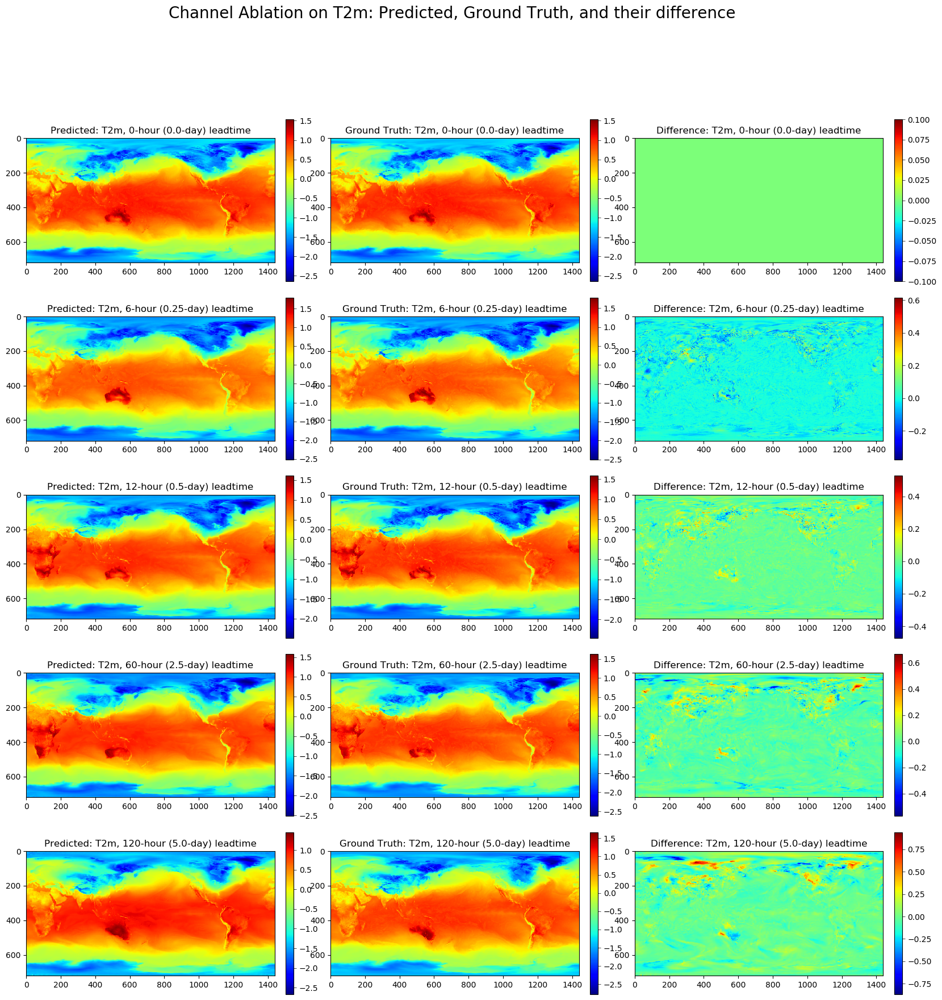

In [12]:
path = '../override_dir/iterative_ablation/predict-T2m_baseline_30-timesteps_vis.h5'
target = index_dict['T2m']
ablate = index_dict['T2m']
steps = 30
lead_times = [0, 1, 2, 10, 20]  # index of timestep (0 timesteps, 1 timestep, etc)

visualize(path, target, ablate, steps, lead_times)

# Example

In [ ]:
directory = '../override_dir/ablation_experiments/'
steps = 30
predict = 'V10'

for predict in predict_variables:
    analyze_ablations(predict, ablate_variables, steps, directory, verbose=False, plot=True, save_path=None)


 Highs are: ['V500', 'T2m', 'sp', 'U1000', 'Z850', 'U500', 'U10', 'TCWV', 'T850', 'mslp'] 
 Lows are : ['V1000', 'V10', 'U850', 'T500', 'Z500', 'Z1000', 'RH850', 'RH500', 'Z50', 'V850']


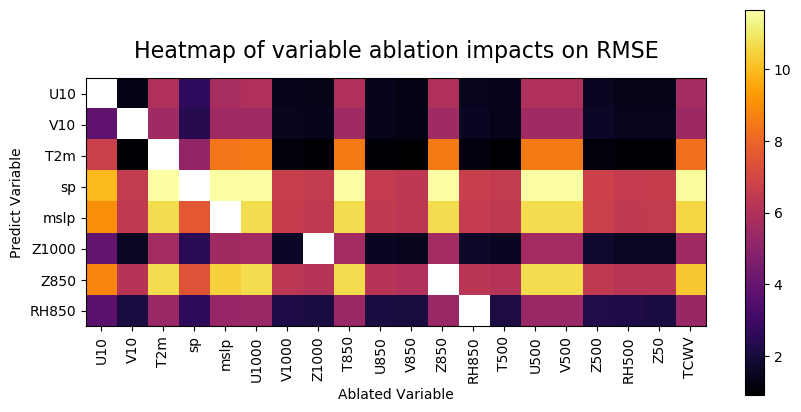

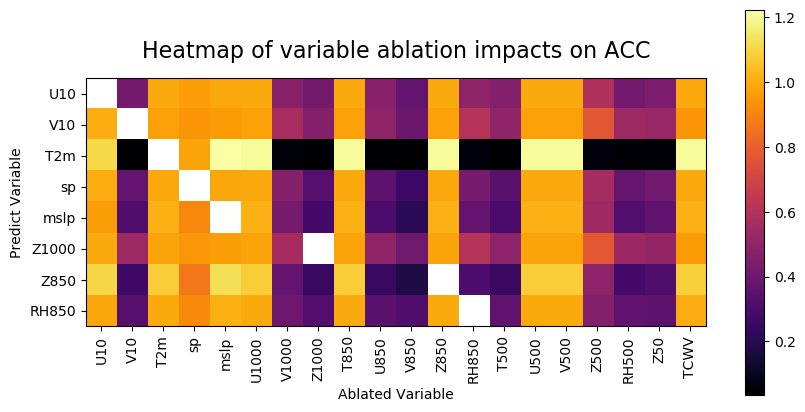

In [17]:
steps = 30
directory = '../override_dir/ablation_experiments/'

highs, lows = set({}), set({})
rmse, acc = {}, {}

for predict in predict_variables:
    rmse_arrays, acc_arrays, high_impact, low_impact, other_impact = analyze_ablations(predict, ablate_variables, steps, directory, verbose=False, plot=False)
    for high in high_impact:
        highs.add(high) 
    for low in low_impact:
        lows.add(low) 
    rmse[predict] = rmse_arrays
    acc[predict] = acc_arrays
    
print(f'\n Highs are: {list(highs)} \n Lows are : {list(lows)}')

heatmap(rmse, 'RMSE')
heatmap(acc, 'ACC')


# Scratchwork

In [ ]:
def plot(trgt, abl, steps, file_path, plots=True, pictures=True):
    f = h5py.File(file_path, 'r')
    idx2name = {-1: "None (baseline)", 0: "U10", 1: "V10", 2: "T2m", 3: "sp", 4: "mslp", 5: "U1000", 6: "V1000", 7: "Z1000", 8: "T850", 9: "U850", 10: "V850", 11: "Z850", 12: "RH850", 13: "T500", 14: "U500", 15: "V500", 16: "Z500", 17: "RH500", 18: "Z50", 19: "TCWV"}

    if plots:
        time = np.arange(f['rmse'].shape[1])

        # Plot RMSE
        plt.plot(time, f['rmse'][0,:,0], marker='o', label='RMSE')
        # plt.plot(time, f['rmse_coarse'][0,:,0], marker='o', label='RMSE Coarse')

        plt.xlabel('Time (6-hour timesteps)')
        plt.ylabel('RMSE')
        plt.title(f'RMSE over Time — Ablated: {idx2name[abl]}')
        plt.legend()
        plt.grid(True)

        plt.show()

        time = np.arange(f['acc'].shape[1])

        # Plot accuracy
        plt.plot(time, f['acc'][0,:,0], marker='o', label='ACC')
        plt.plot(time, f['acc_unweighted'][0,:,0], marker='o', label='ACC Unweighted')
        # plt.plot(time, f['acc_coarse'][0,:,0], marker='o', label='Accuracy Coarse')
        # plt.plot(time, f['acc_coarse_unweighted'][0,:,0], marker='o', label='Accuracy Coarse Unweighted')

        plt.xlabel('Time (6-hour timesteps)')
        plt.ylabel('Anomaly Correlation Coefficient (ACC)')
        plt.title(f'Weather Prediction Skill (ACC) over time — Ablated: {idx2name[abl]}')
        plt.legend()
        # plt.grid(True)

        plt.show()

    rmse = f['rmse'][0,:,0]
    acc = f['acc'][0,:,0]
    time = np.arange(f['acc'].shape[1])


    # CHANNEL 1 info
    if pictures:
        pred = f['predicted']
        truth = f['ground_truth']

        # Create the figure and axes
        # lead_times = [0, 1, 2, 3, 4]
        lead_times = [i for i in range(steps)]
        names = ['predicted', 'ground truth', 'difference']

        fig, axes = plt.subplots(len(lead_times), len(names), figsize=(20, 20))
        fig.subplots_adjust(hspace=0.1, wspace=0.12)
        
        # Define target predicted channel
        c = trgt
        
        for i, t in enumerate(lead_times):
            var_data1 = pred[0, t, c, :, :]
            # Plot the variable
            ax = axes[i, 0]
            im = ax.imshow(var_data1, cmap='jet')  # Modify the cmap if desired
            ax.set_title(f'Predicted: {idx2name[c]}, {t*6}-hour ({t*6/24}-day) leadtime')
            cbar1 = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
            cbar1.ax.yaxis.set_tick_params(width=0.5)  # Adjust the width of colorbar ticks

            var_data2 = truth[0, t, c, :, :]
            # Plot the variable
            ax = axes[i, 1]
            im = ax.imshow(var_data2, cmap='jet')  # Modify the cmap if desired
            ax.set_title(f'Ground Truth: {idx2name[c]}, {t*6}-hour ({t*6/24}-day) leadtime')
            cbar2 = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
            cbar2.ax.yaxis.set_tick_params(width=0.5)  # Adjust the width of colorbar ticks

            var_data3 = np.subtract(var_data1, var_data2)
            # Plot the variable
            ax = axes[i, 2]
            im = ax.imshow(var_data3, cmap='jet')  # Modify the cmap if desired
            ax.set_title(f'Difference: {idx2name[c]}, {t*6}-hour ({t*6/24}-day) leadtime')
            cbar3 = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
            cbar3.ax.yaxis.set_tick_params(width=0.5)  # Adjust the width of colorbar ticks

        # Show the plot
        plt.suptitle(f"Channel Ablation on {idx2name[abl]}: Predicted, Ground Truth, and their difference", fontsize=20)
        plt.show()
    return rmse, acc, time

In [ ]:
predict_variables = ['U10', 'V10', 'T2m']
ablate_variables = ['U10', 'V10', 'T2m']

filePath = 'FourCastNet/override_dir/experiments/predict-U10_ablate-T2m_30-timesteps_vis.h5'

In [40]:
h = [8, 14, 11, 2, 15, 5]
m = [19, 4]
l = [3, 7, 17, 6, 1, 10, 9, 12, 13, 16, 18]
impact = l

abl_vars = [idx2name[i] for i in impact] 

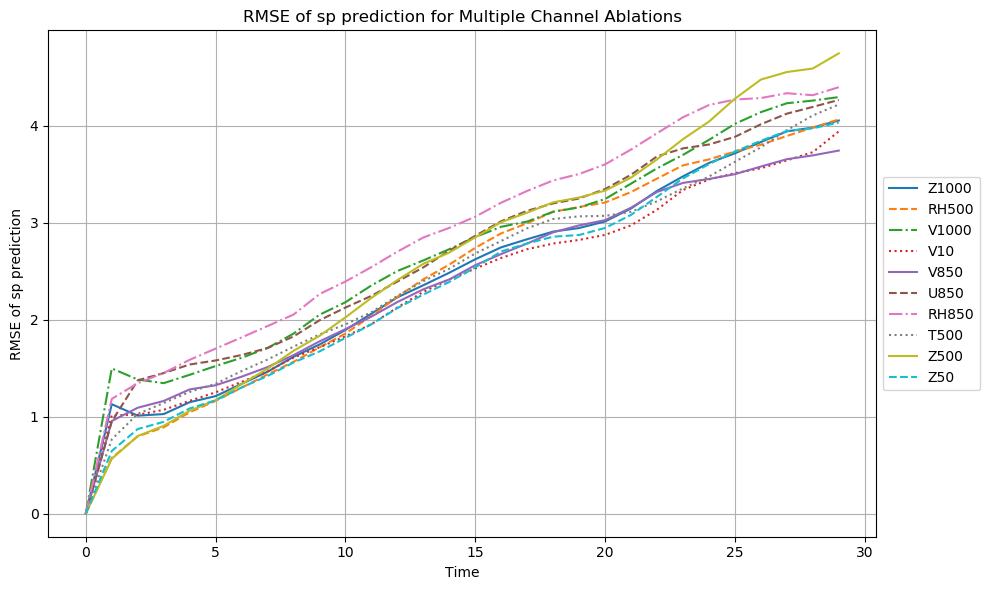

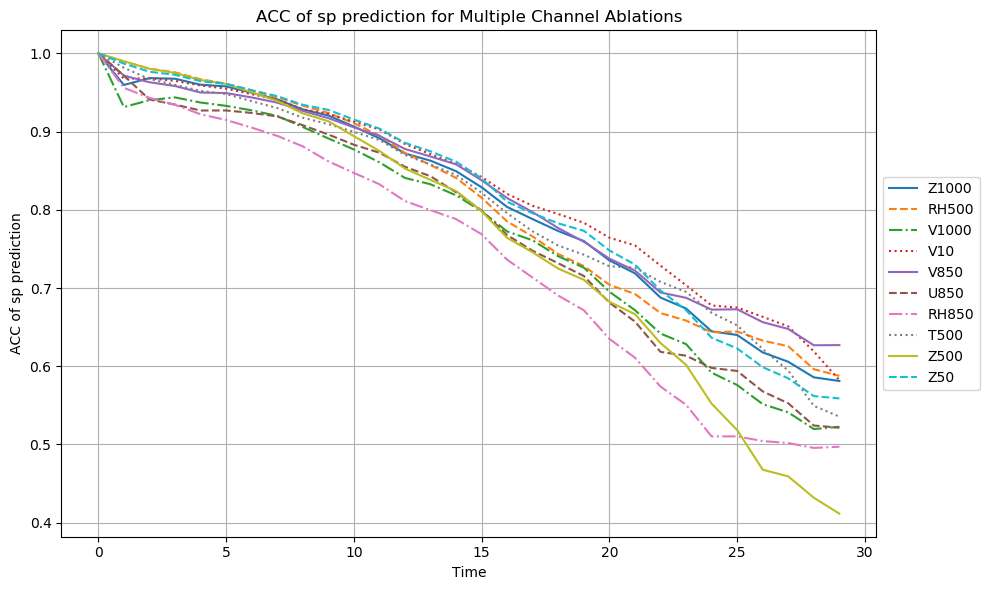

In [41]:
compare_ablations(predict_var='sp', ablate_variables=abl_vars, steps=30, file_directory='FourCastNet/override_dir/experiments/')

name - V10, index = 1
name - T2m, index = 2
name - sp, index = 3
name - mslp, index = 4
name - U1000, index = 5
name - V1000, index = 6
name - Z1000, index = 7
name - T850, index = 8
name - U850, index = 9
name - V850, index = 10
name - Z850, index = 11
name - RH850, index = 12
name - T500, index = 13
name - U500, index = 14
name - V500, index = 15
name - Z500, index = 16
name - RH500, index = 17
name - Z50, index = 18
name - TCWV, index = 19


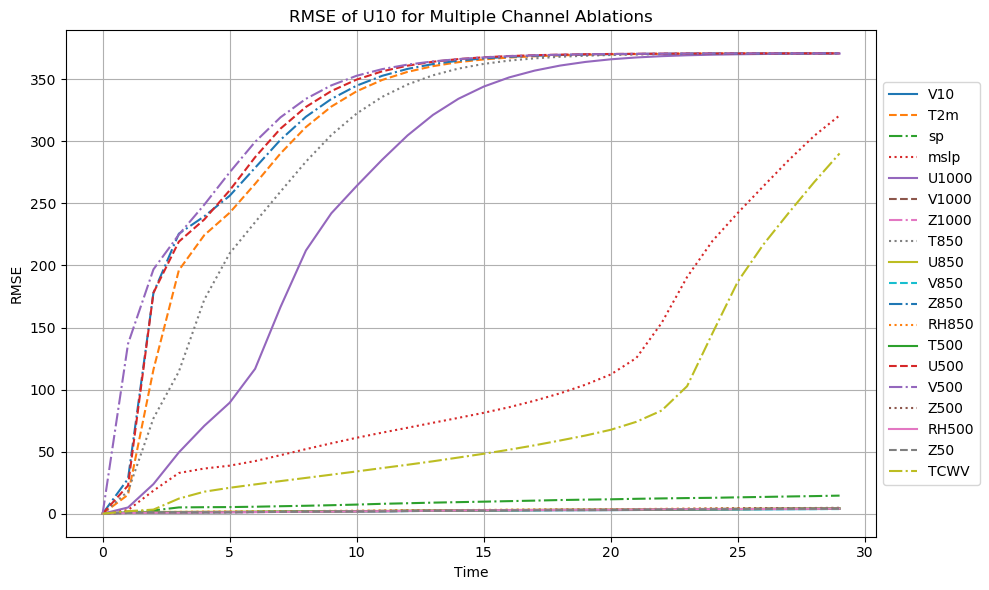

name - V10, index = 1
name - T2m, index = 2
name - sp, index = 3
name - mslp, index = 4
name - U1000, index = 5
name - V1000, index = 6
name - Z1000, index = 7
name - T850, index = 8
name - U850, index = 9
name - V850, index = 10
name - Z850, index = 11
name - RH850, index = 12
name - T500, index = 13
name - U500, index = 14
name - V500, index = 15
name - Z500, index = 16
name - RH500, index = 17
name - Z50, index = 18
name - TCWV, index = 19


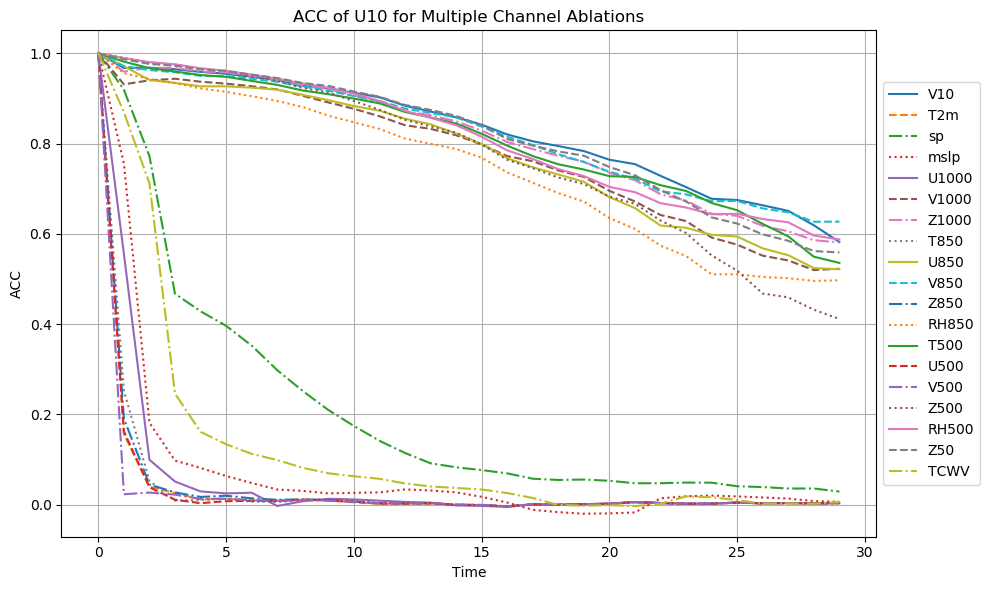

In [13]:
# num_arrays = 2
time = None
rmse_arrays = []
acc_arrays = []

h = [8, 14, 11, 2, 15, 5]
m = [19, 4]
l = [3, 7, 17, 6, 1, 10, 9, 12, 13, 16, 18]

s = [idxes[abl] for abl in ablate_variables]
s = s[1:]

steps = 30

for i in range(len(s)):
  abl = s[i]
  file_path = f'FourCastNet/override_dir/experiments/predict-U10_ablate-{idx2name[abl]}_30-timesteps_vis.h5'
  rmse, acc, time = plot(0, abl, steps, file_path, False, False)  # Replace with your actual RMSE arrays
  rmse_arrays.append(rmse)
  acc_arrays.append(acc)


# Define the line styles to rotate
line_styles = ['-', '--', '-.', ':']


# Create the plot
plt.figure(figsize=(10, 6))
for i, rmse_array in enumerate(rmse_arrays):
    index = s[i]
    line_style = line_styles[i % len(line_styles)]  # Rotate line styles
    print(f"name - {idx2name[index]}, index = {index}")
    plt.plot(time, rmse_array, linestyle=line_style, label=idx2name[index])


plt.xlabel('Time')
plt.ylabel('RMSE')
plt.title('RMSE of U10 for Multiple Channel Ablations')
plt.legend()
plt.grid(True)

plt.legend(bbox_to_anchor=(1, 0.5), loc='center left')  # Position legend on the right
plt.tight_layout()  # Adjust plot layout

# Display the plot
plt.show()


# Create the plot
plt.figure(figsize=(10, 6))
for i, acc_array in enumerate(acc_arrays):
    index = s[i]
    line_style = line_styles[i % len(line_styles)]  # Rotate line styles
    print(f"name - {idx2name[index]}, index = {index}")
    plt.plot(time, acc_array, linestyle=line_style, label=idx2name[index])


plt.xlabel('Time')
plt.ylabel('ACC')
plt.title(f'ACC of U10 for Multiple Channel Ablations')
plt.legend()
plt.grid(True)
plt.legend(bbox_to_anchor=(1, 0.5), loc='center left')  # Position legend on the right
plt.tight_layout()  # Adjust plot layout

# Display the plot
plt.show()


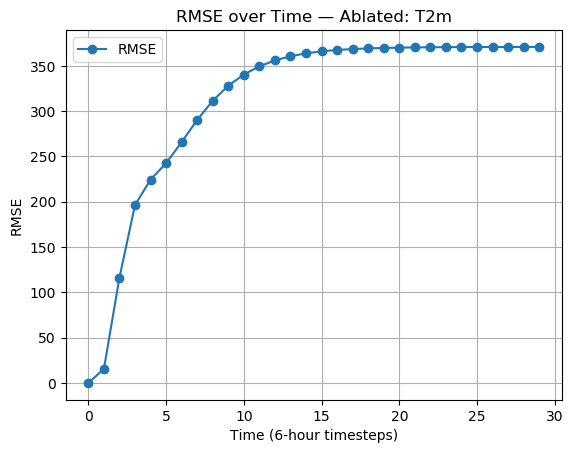

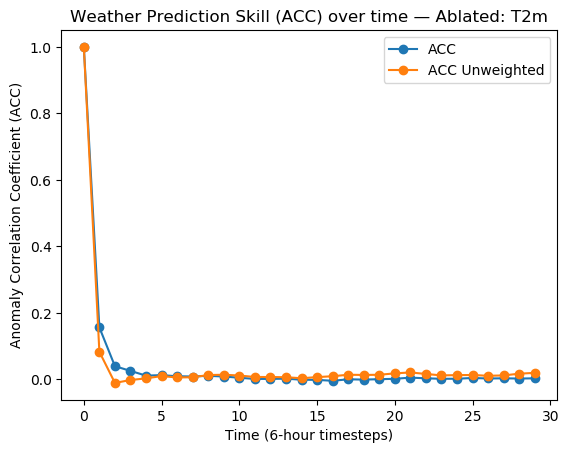

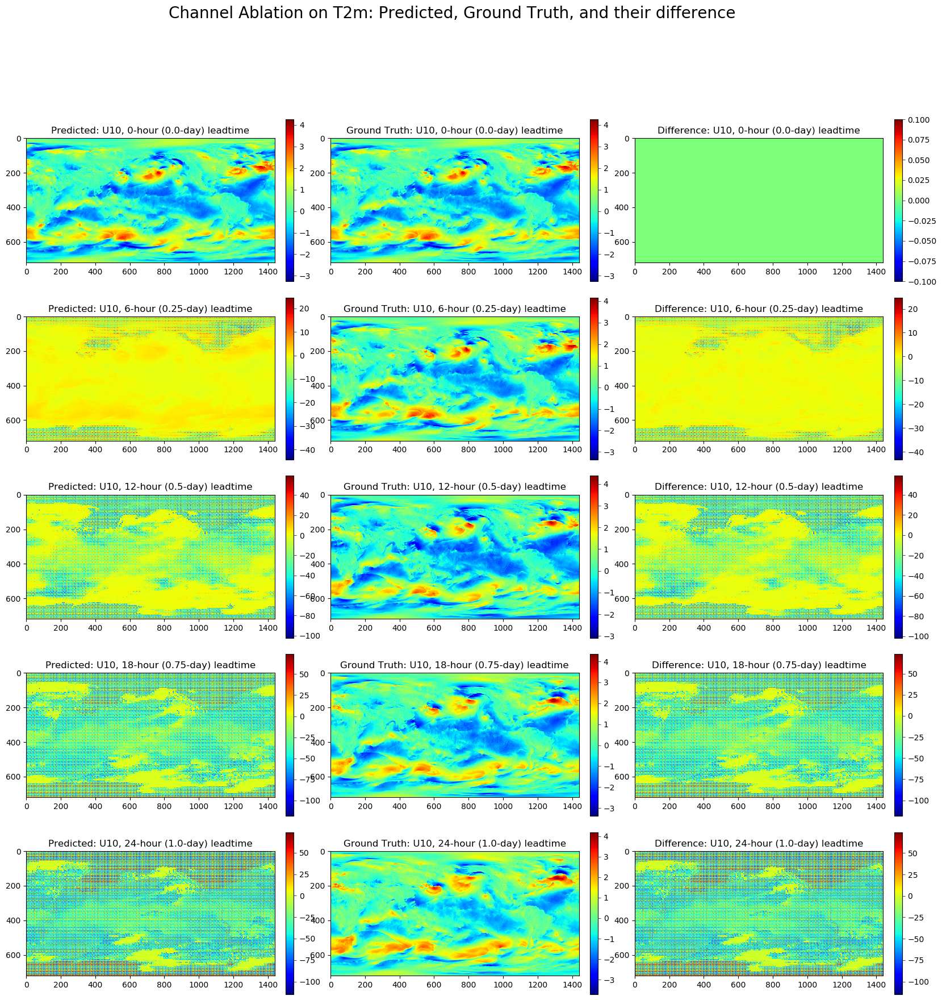

In [22]:
path = 'FourCastNet/override_dir/experiments/testing/predict-U10_ablate-V10_3-timesteps_vis.h5'
pathp = 'FourCastNet/override_dir/experiments/predict-U10_ablate-T2m_30-timesteps_vis.h5'
# Use regular expressions to extract 'U10' and 'V10' from the path
pred, abla, steps = 'U10', 'T2m', 5

# Call the plot function with the extracted values
rmse, acc, time = plot(idxes[pred], idxes[abla], steps, pathp)

In [ ]:
path = 'FourCastNet/override_dir/experiments/predict-U10_ablate-V10_3-timesteps_vis.h5'
pred = 
abla = 
rmse, acc, time = plot(idxes[pred], idxes[abla], path)

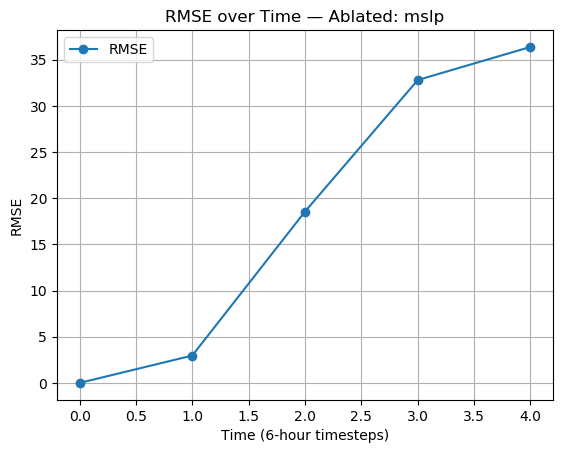

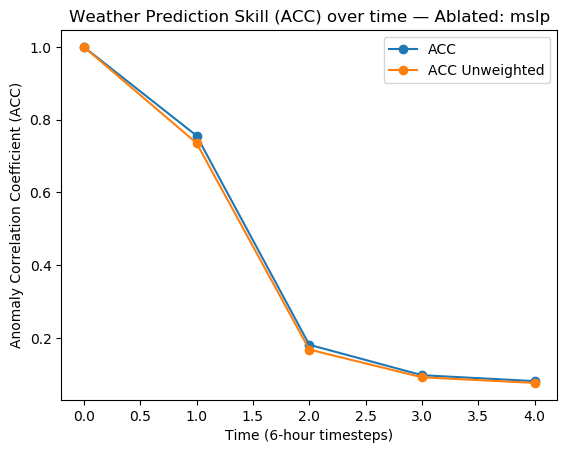

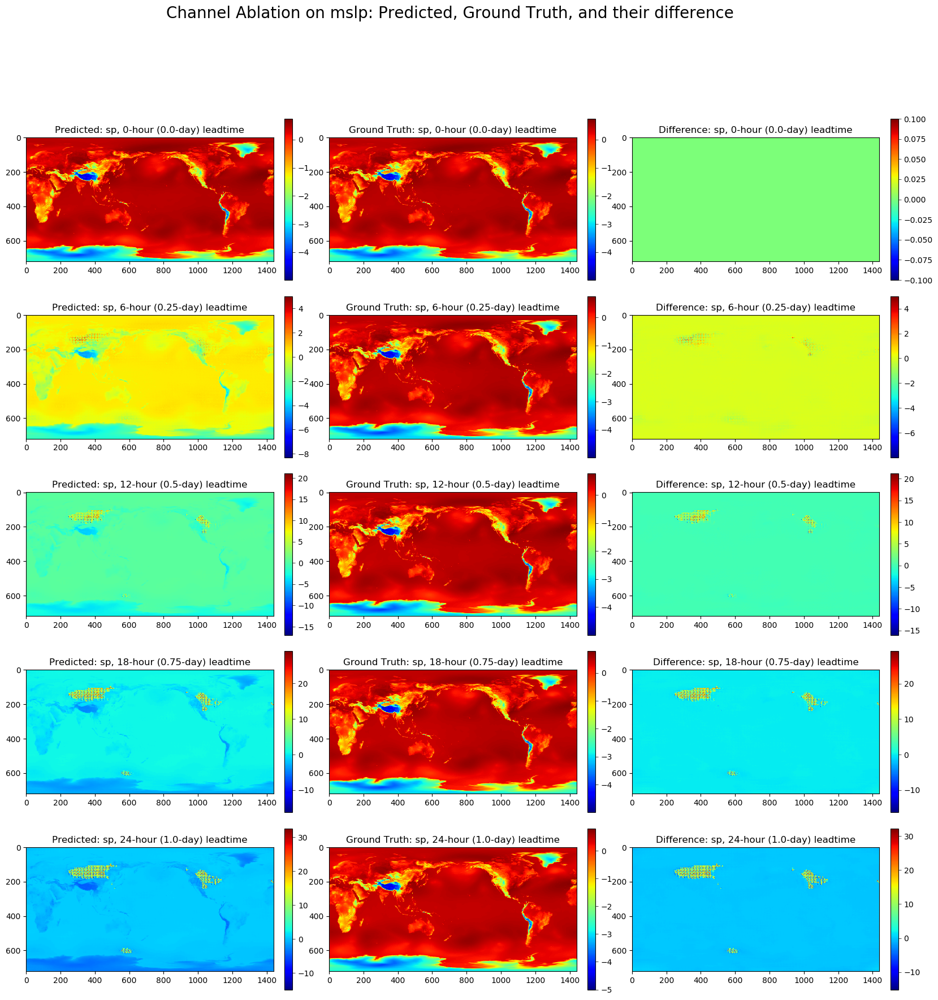

(array([ 0.       ,  2.9643068, 18.560183 , 32.800407 , 36.3866   ],
       dtype=float32),
 array([1.        , 0.7559933 , 0.18126497, 0.09751025, 0.0812472 ],
       dtype=float32),
 array([0, 1, 2, 3, 4]))

In [7]:
path = 'FourCastNet/override_dir/ablation/predict-sp_ablate-mslp_5-timesteps_vis.h5'
pred = 'sp'
abla = 'mslp'
plot(idxes[pred], idxes[abla], path)

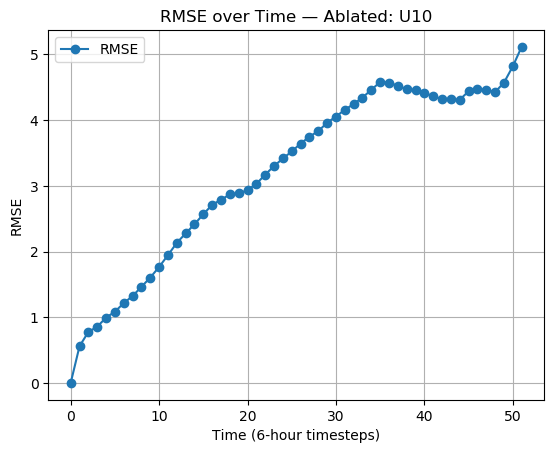

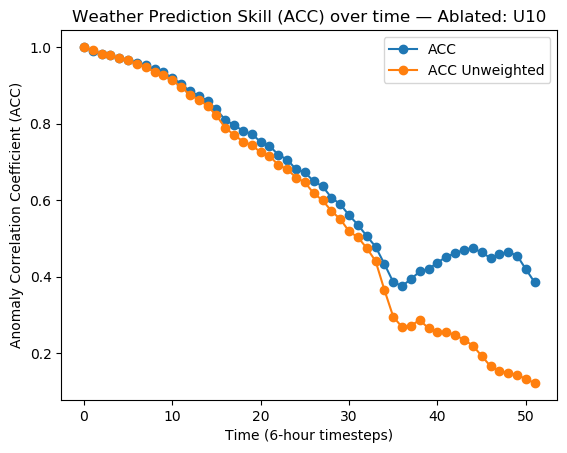

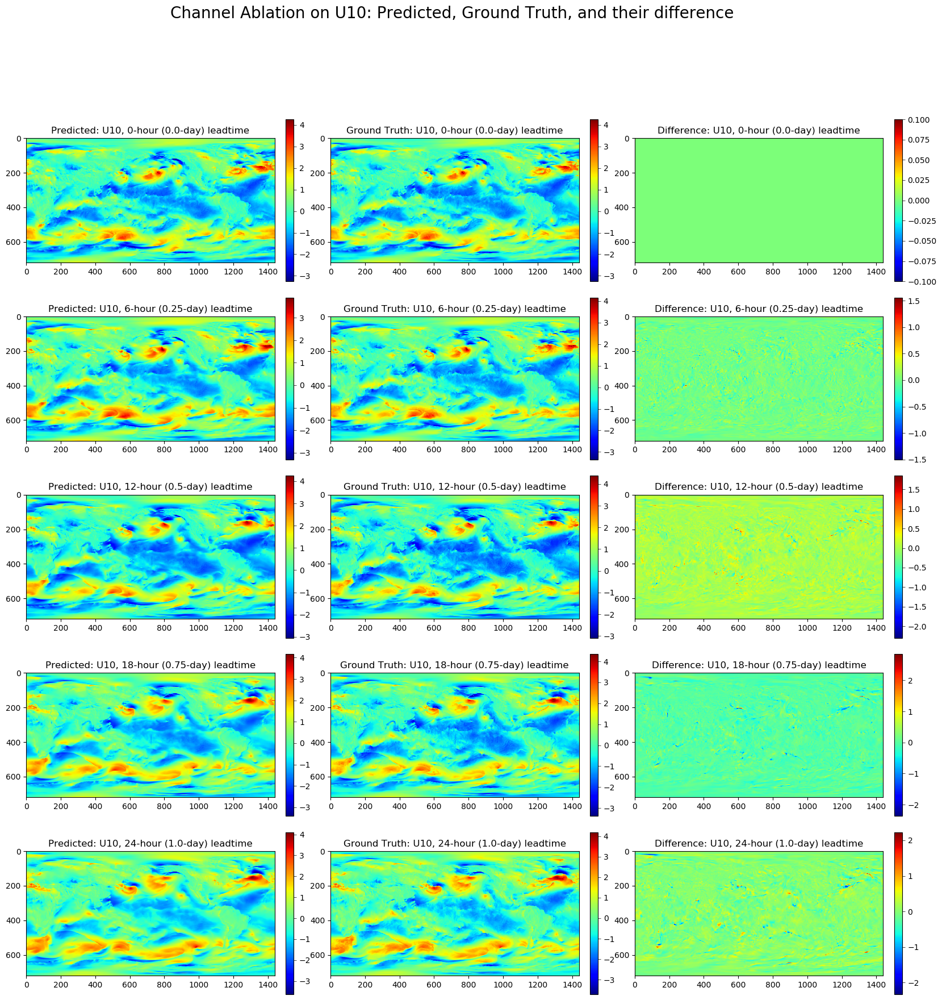

(array([0.       , 0.5590931, 0.7761334, 0.8559065, 0.9933352, 1.084042 ,
        1.2145159, 1.3224697, 1.4626011, 1.6035945, 1.7647966, 1.9450164,
        2.1313355, 2.2752821, 2.414881 , 2.5672991, 2.7113104, 2.787369 ,
        2.868622 , 2.8856497, 2.932452 , 3.030047 , 3.1695042, 3.3011394,
        3.4156349, 3.5223558, 3.6419609, 3.7479916, 3.8313105, 3.959641 ,
        4.0533404, 4.1561623, 4.244533 , 4.3423133, 4.460883 , 4.5793514,
        4.5709248, 4.5215077, 4.470479 , 4.456635 , 4.4056973, 4.36984  ,
        4.3136325, 4.3153515, 4.3100963, 4.4372444, 4.478767 , 4.458523 ,
        4.4269686, 4.568368 , 4.816342 , 5.113301 ], dtype=float32),
 array([1.        , 0.9902382 , 0.9814416 , 0.97761685, 0.9702491 ,
        0.96639735, 0.9588381 , 0.9523355 , 0.9417335 , 0.933271  ,
        0.9193205 , 0.90424776, 0.8841646 , 0.8729959 , 0.85841304,
        0.83666843, 0.80931574, 0.7957526 , 0.78113675, 0.77246284,
        0.75235707, 0.7418485 , 0.7182262 , 0.7060644 , 0.6804043 ,

In [22]:
# Reproduce experiment from cs231n
file_path = 'FourCastNet/override_dir/autoregressive_predictions_u10_vis_52steps.h5'
plot(0, 0, file_path)

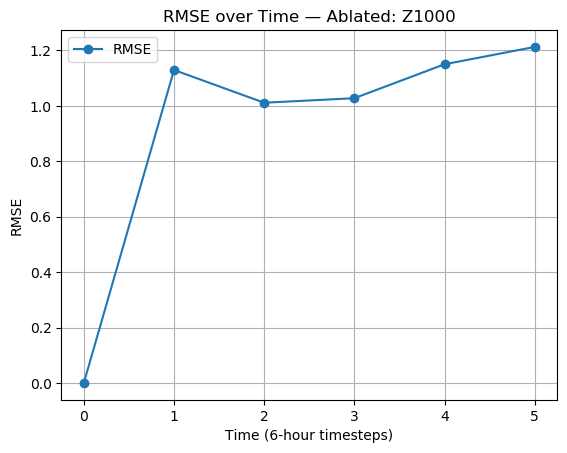

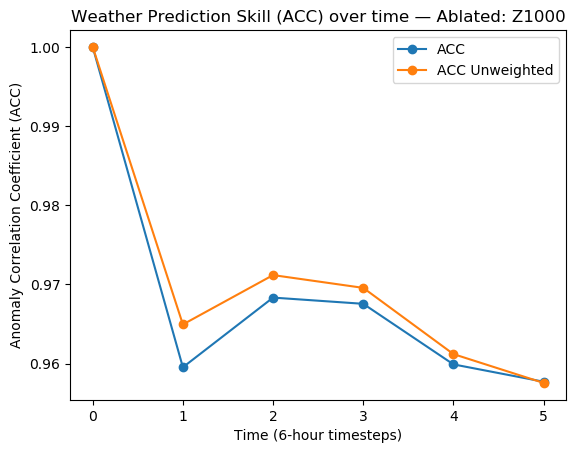

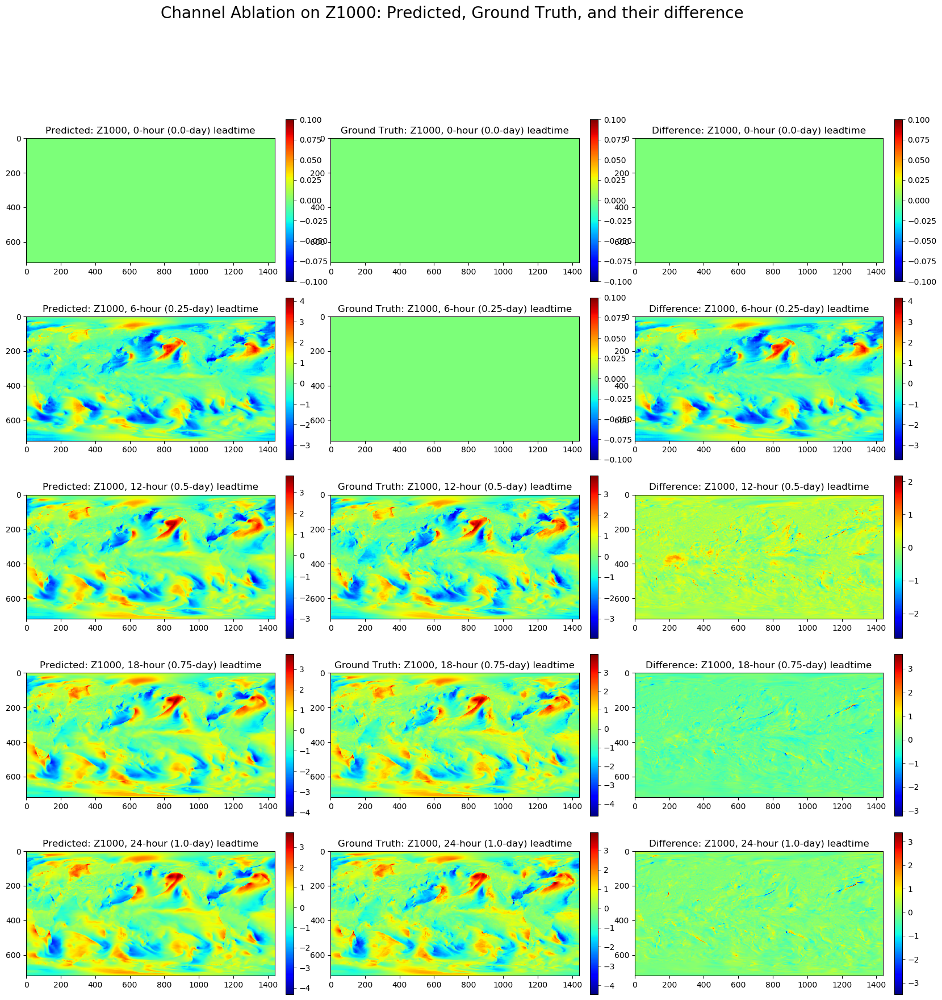

(array([0.       , 1.129477 , 1.0112966, 1.0276484, 1.1501436, 1.2127442],
       dtype=float32),
 array([1.        , 0.95954484, 0.9683463 , 0.9675605 , 0.95991224,
        0.9577233 ], dtype=float32),
 array([0, 1, 2, 3, 4, 5]))

In [19]:
# Reproduce experiment from cs231n
file_path = 'FourCastNet/override_dir/ablation/predict-U10_ablate-Z1000_6-timesteps_vis.h5'
plot(7, file_path)

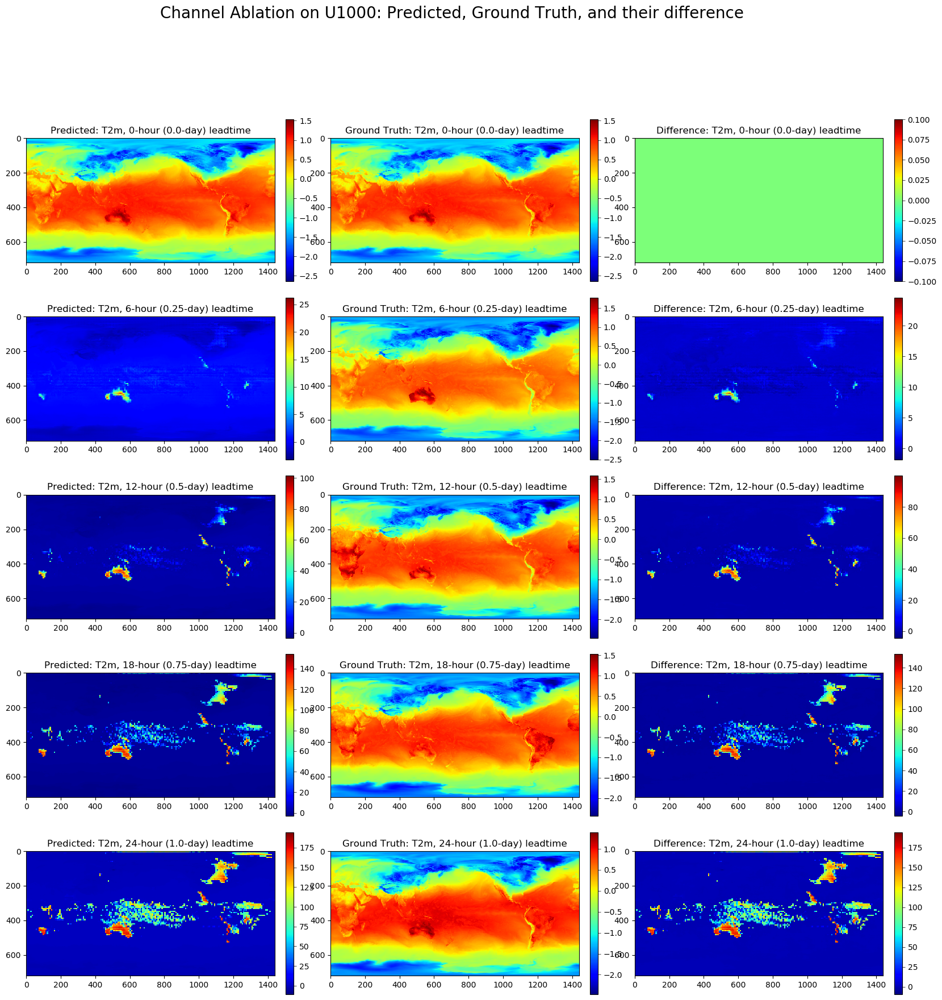

(array([ 0.      ,  5.022722, 23.860481, 49.40359 , 70.78691 , 89.43078 ],
       dtype=float32),
 array([1.        , 0.55588764, 0.09932651, 0.05113816, 0.02919097,
        0.02485175], dtype=float32),
 array([0, 1, 2, 3, 4, 5]))

In [14]:
# Reproduce experiment from cs231n
file_path = 'FourCastNet/override_dir/ablation/predict-U10_ablate-U1000_6-timesteps_vis.h5'
plot(5, file_path, plots=False)

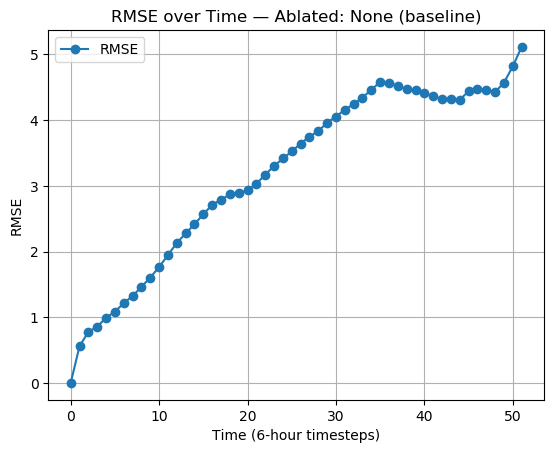

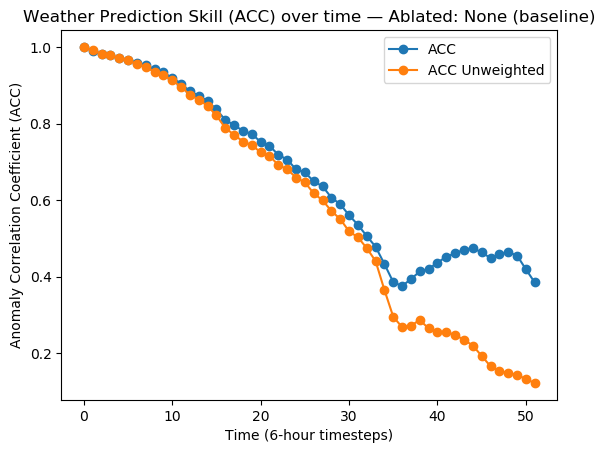

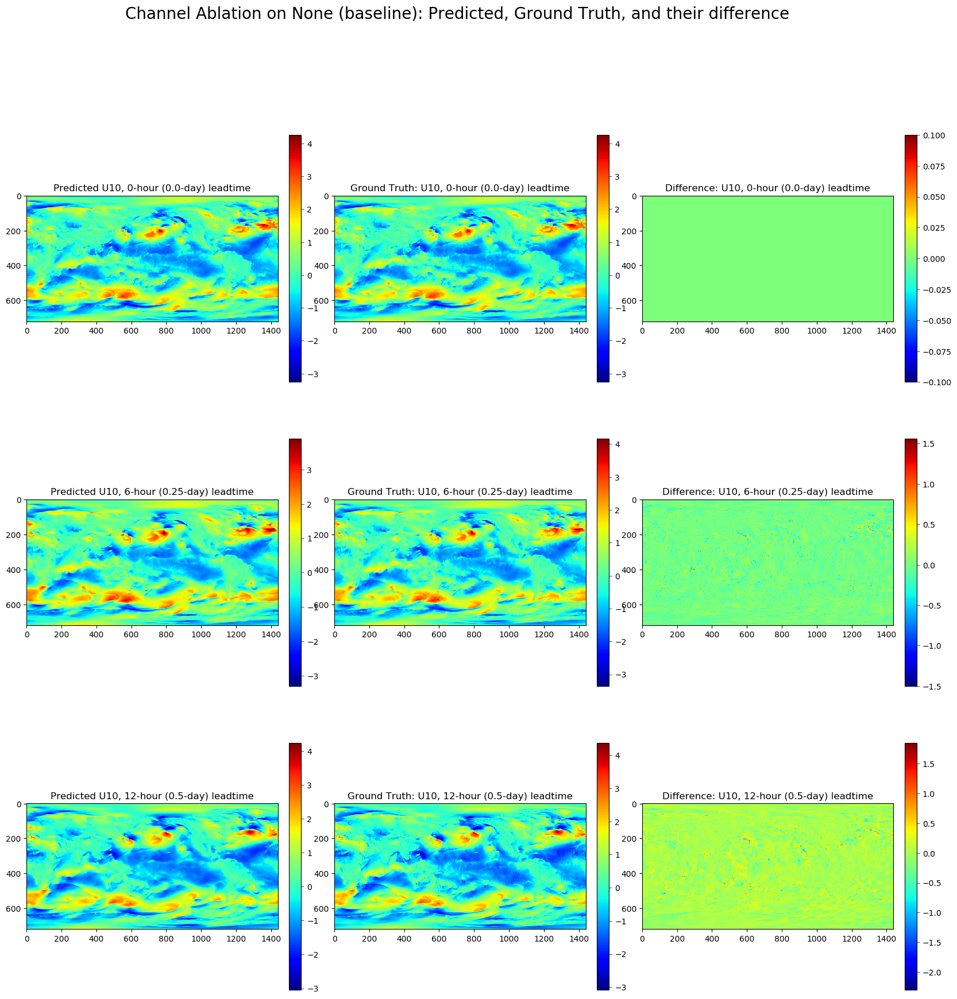

(array([0.       , 0.5590931, 0.7761334, 0.8559065, 0.9933352, 1.084042 ,
        1.2145159, 1.3224697, 1.4626011, 1.6035945, 1.7647966, 1.9450164,
        2.1313355, 2.2752821, 2.414881 , 2.5672991, 2.7113104, 2.787369 ,
        2.868622 , 2.8856497, 2.932452 , 3.030047 , 3.1695042, 3.3011394,
        3.4156349, 3.5223558, 3.6419609, 3.7479916, 3.8313105, 3.959641 ,
        4.0533404, 4.1561623, 4.244533 , 4.3423133, 4.460883 , 4.5793514,
        4.5709248, 4.5215077, 4.470479 , 4.456635 , 4.4056973, 4.36984  ,
        4.3136325, 4.3153515, 4.3100963, 4.4372444, 4.478767 , 4.458523 ,
        4.4269686, 4.568368 , 4.816342 , 5.113301 ], dtype=float32),
 array([1.        , 0.9902382 , 0.9814416 , 0.97761685, 0.9702491 ,
        0.96639735, 0.9588381 , 0.9523355 , 0.9417335 , 0.933271  ,
        0.9193205 , 0.90424776, 0.8841646 , 0.8729959 , 0.85841304,
        0.83666843, 0.80931574, 0.7957526 , 0.78113675, 0.77246284,
        0.75235707, 0.7418485 , 0.7182262 , 0.7060644 , 0.6804043 ,

In [6]:
# Baseline
file_path = 'FourCastNet/override_dir/autoregressive_predictions_u10_vis_52steps.h5'
plot(-1, file_path)

## Plot code

In [262]:
def plot(trgt, abl, steps, file_path, plots=True, pictures=True):
    f = h5py.File(file_path, 'r')
    idx2name = {-1: "None (baseline)", 0: "U10", 1: "V10", 2: "T2m", 3: "sp", 4: "mslp", 5: "U1000", 6: "V1000", 7: "Z1000", 8: "T850", 9: "U850", 10: "V850", 11: "Z850", 12: "RH850", 13: "T500", 14: "U500", 15: "V500", 16: "Z500", 17: "RH500", 18: "Z50", 19: "TCWV"}

    if plots:
        time = np.arange(f['rmse'].shape[1])

        # Plot RMSE
        plt.plot(time, f['rmse'][0,:,0], marker='o', label='RMSE')
        # plt.plot(time, f['rmse_coarse'][0,:,0], marker='o', label='RMSE Coarse')

        plt.xlabel('Time (6-hour timesteps)')
        plt.ylabel('RMSE')
        plt.title(f'RMSE over Time — Ablated: {idx2name[abl]}')
        plt.legend()
        plt.grid(True)

        plt.show()

        time = np.arange(f['acc'].shape[1])

        # Plot accuracy
        plt.plot(time, f['acc'][0,:,0], marker='o', label='ACC')
        plt.plot(time, f['acc_unweighted'][0,:,0], marker='o', label='ACC Unweighted')
        # plt.plot(time, f['acc_coarse'][0,:,0], marker='o', label='Accuracy Coarse')
        # plt.plot(time, f['acc_coarse_unweighted'][0,:,0], marker='o', label='Accuracy Coarse Unweighted')

        plt.xlabel('Time (6-hour timesteps)')
        plt.ylabel('Anomaly Correlation Coefficient (ACC)')
        plt.title(f'Weather Prediction Skill (ACC) over time — Ablated: {idx2name[abl]}')
        plt.legend()
        # plt.grid(True)

        plt.show()

    rmse = f['rmse'][0,:,0]
    acc = f['acc'][0,:,0]
    time = np.arange(f['acc'].shape[1])


    # CHANNEL 1 info
    if pictures:
        pred = f['predicted']
        truth = f['ground_truth']

        # Create the figure and axes
        # lead_times = [0, 1, 2, 3, 4]
        lead_times = [i for i in range(steps)]
        names = ['predicted', 'ground truth', 'difference']

        fig, axes = plt.subplots(len(lead_times), len(names), figsize=(20, 20))
        fig.subplots_adjust(hspace=0.1, wspace=0.12)
        
        # Define target predicted channel
        c = trgt
        
        for i, t in enumerate(lead_times):
            var_data1 = pred[0, t, c, :, :]
            # Plot the variable
            ax = axes[i, 0]
            im = ax.imshow(var_data1, cmap='jet')  # Modify the cmap if desired
            ax.set_title(f'Predicted: {idx2name[c]}, {t*6}-hour ({t*6/24}-day) leadtime')
            cbar1 = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
            cbar1.ax.yaxis.set_tick_params(width=0.5)  # Adjust the width of colorbar ticks

            var_data2 = truth[0, t, c, :, :]
            # Plot the variable
            ax = axes[i, 1]
            im = ax.imshow(var_data2, cmap='jet')  # Modify the cmap if desired
            ax.set_title(f'Ground Truth: {idx2name[c]}, {t*6}-hour ({t*6/24}-day) leadtime')
            cbar2 = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
            cbar2.ax.yaxis.set_tick_params(width=0.5)  # Adjust the width of colorbar ticks

            var_data3 = np.subtract(var_data1, var_data2)
            # Plot the variable
            ax = axes[i, 2]
            im = ax.imshow(var_data3, cmap='jet')  # Modify the cmap if desired
            ax.set_title(f'Difference: {idx2name[c]}, {t*6}-hour ({t*6/24}-day) leadtime')
            cbar3 = fig.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
            cbar3.ax.yaxis.set_tick_params(width=0.5)  # Adjust the width of colorbar ticks

        # Show the plot
        plt.suptitle(f"Channel Ablation on {idx2name[abl]}: Predicted, Ground Truth, and their difference", fontsize=20)
        plt.show()
    return rmse, acc, time

## Precipitation

In [263]:
path = 'FourCastNet/override_dir/precip/autoregressive_predictions_tp_20steps.h5'

In [264]:
f = h5py.File(path, 'r')

In [265]:
print(f.keys())

<KeysViewHDF5 ['acc', 'acc_unweighted', 'ground_truth', 'predicted', 'rmse', 'tqe']>


In [266]:
tqe = f['tqe']
predicted = f['predicted']

print(tqe[0])
print(predicted[0].shape)

[[ 0.        ]
 [-0.00191741]
 [-0.00185685]
 [-0.00226976]
 [-0.00188965]
 [-0.00203309]
 [-0.0021133 ]
 [-0.00205812]
 [-0.0014671 ]
 [-0.00187443]
 [-0.00220921]
 [-0.00325806]
 [-0.0028132 ]
 [-0.00240686]
 [-0.00196308]
 [-0.00188267]
 [-0.00219741]
 [-0.00254346]
 [-0.00243873]
 [-0.00251306]]
(20, 1, 720, 1440)


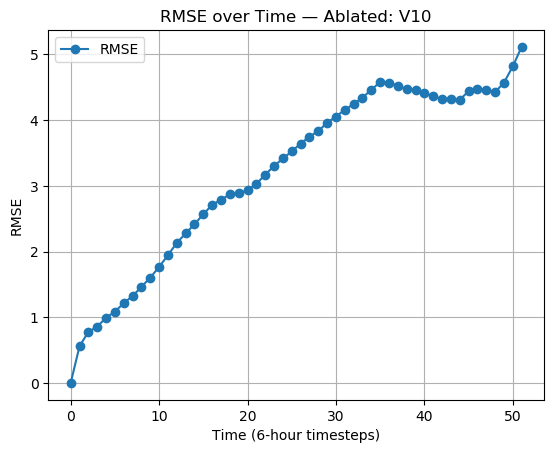

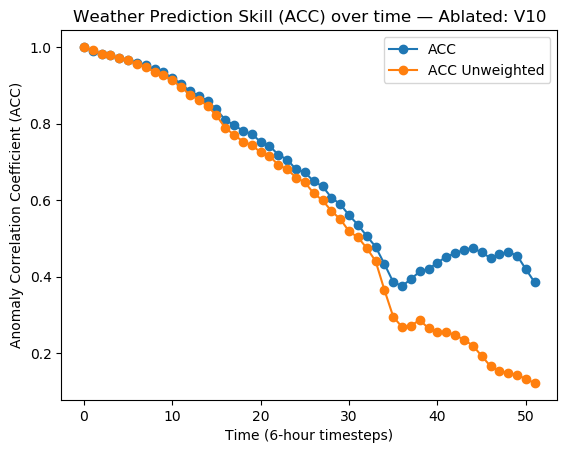

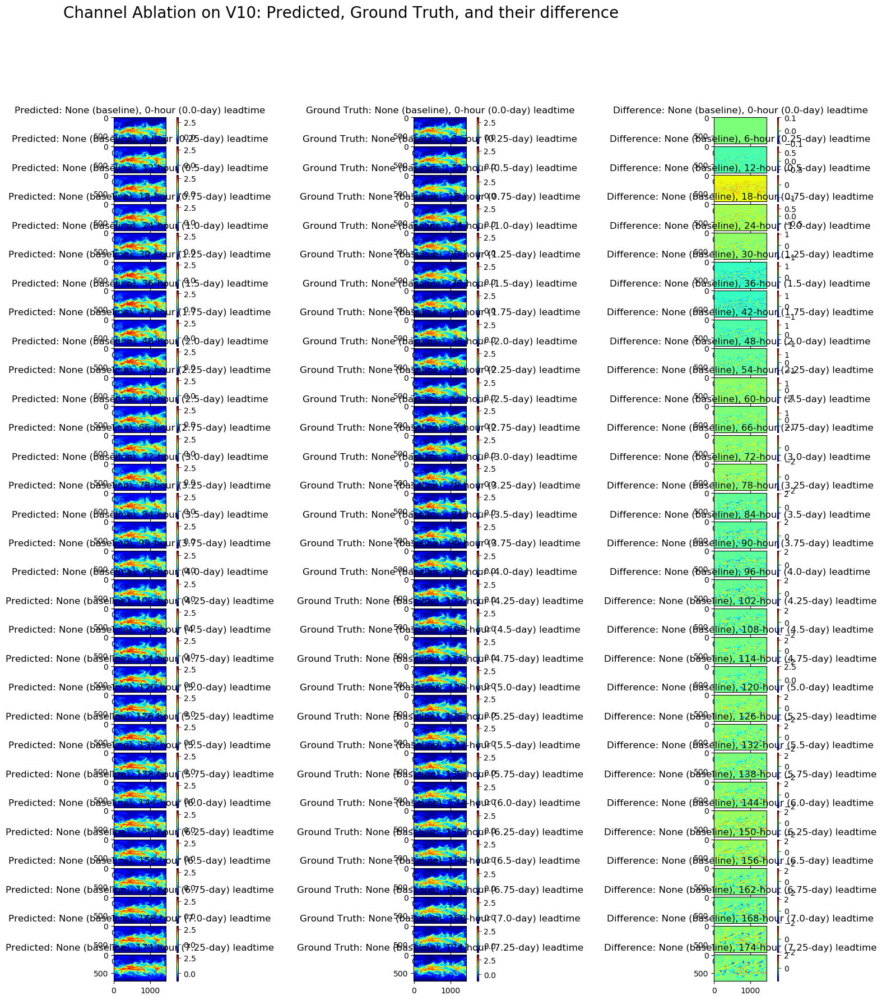

(array([0.       , 0.5590931, 0.7761334, 0.8559065, 0.9933352, 1.084042 ,
        1.2145159, 1.3224697, 1.4626011, 1.6035945, 1.7647966, 1.9450164,
        2.1313355, 2.2752821, 2.414881 , 2.5672991, 2.7113104, 2.787369 ,
        2.868622 , 2.8856497, 2.932452 , 3.030047 , 3.1695042, 3.3011394,
        3.4156349, 3.5223558, 3.6419609, 3.7479916, 3.8313105, 3.959641 ,
        4.0533404, 4.1561623, 4.244533 , 4.3423133, 4.460883 , 4.5793514,
        4.5709248, 4.5215077, 4.470479 , 4.456635 , 4.4056973, 4.36984  ,
        4.3136325, 4.3153515, 4.3100963, 4.4372444, 4.478767 , 4.458523 ,
        4.4269686, 4.568368 , 4.816342 , 5.113301 ], dtype=float32),
 array([1.        , 0.9902382 , 0.9814416 , 0.97761685, 0.9702491 ,
        0.96639735, 0.9588381 , 0.9523355 , 0.9417335 , 0.933271  ,
        0.9193205 , 0.90424776, 0.8841646 , 0.8729959 , 0.85841304,
        0.83666843, 0.80931574, 0.7957526 , 0.78113675, 0.77246284,
        0.75235707, 0.7418485 , 0.7182262 , 0.7060644 , 0.6804043 ,

In [276]:
plot(-1, 1, 30, 'FourCastNet/override_dir/autoregressive_predictions_u10_vis_52steps.h5')

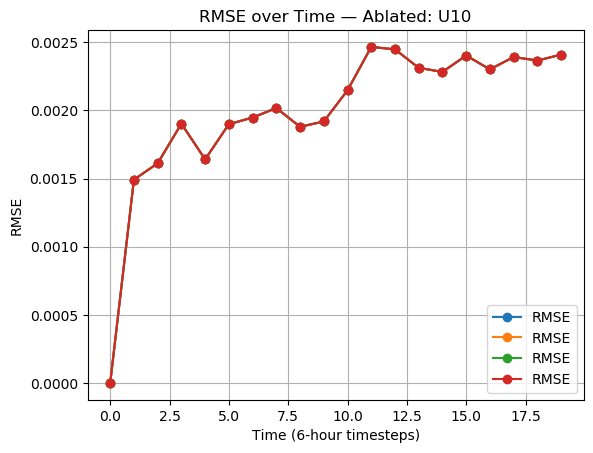

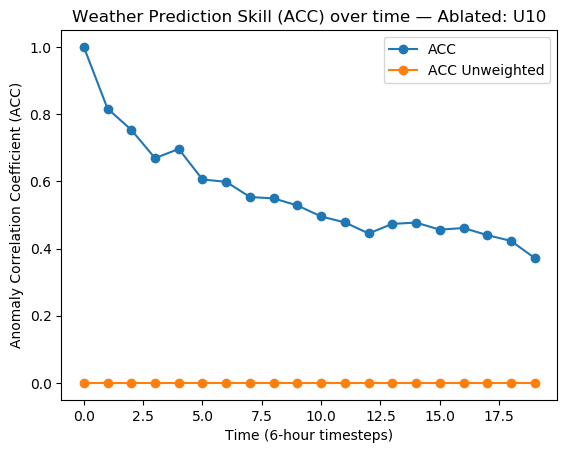

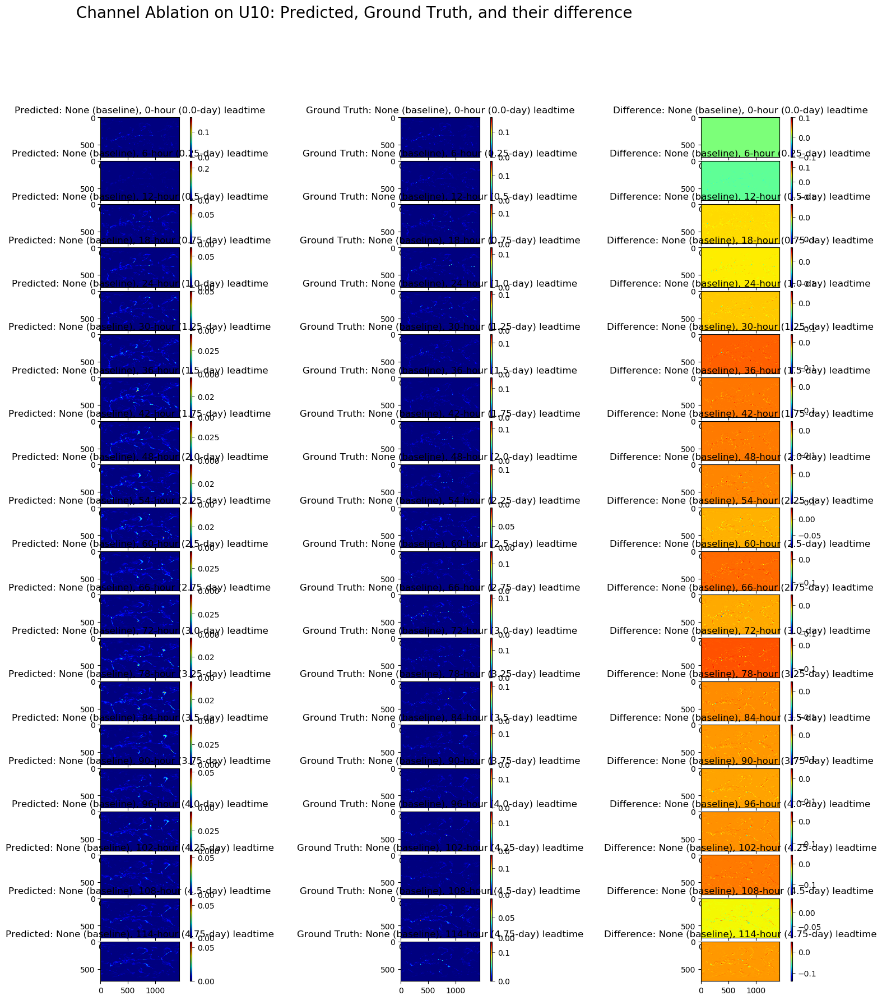

(array([0.        , 0.00149201, 0.00161194, 0.00190268, 0.00164097,
        0.00189933, 0.00194776, 0.00201764, 0.00187998, 0.00191899,
        0.00214767, 0.00246629, 0.00244848, 0.00231258, 0.00228289,
        0.00240306, 0.00230143, 0.00239241, 0.00236623, 0.00240998],
       dtype=float32),
 array([1.        , 0.81619966, 0.7532539 , 0.66889066, 0.69636583,
        0.6055255 , 0.59843886, 0.5532555 , 0.5491823 , 0.5281257 ,
        0.4954178 , 0.47770768, 0.44482818, 0.47337592, 0.47715884,
        0.45610586, 0.46113726, 0.4398399 , 0.4226664 , 0.3715459 ],
       dtype=float32),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19]))

In [272]:
plot(-1, 0, 20, path)